   # <center>  Project- Swiggy Data Analysis


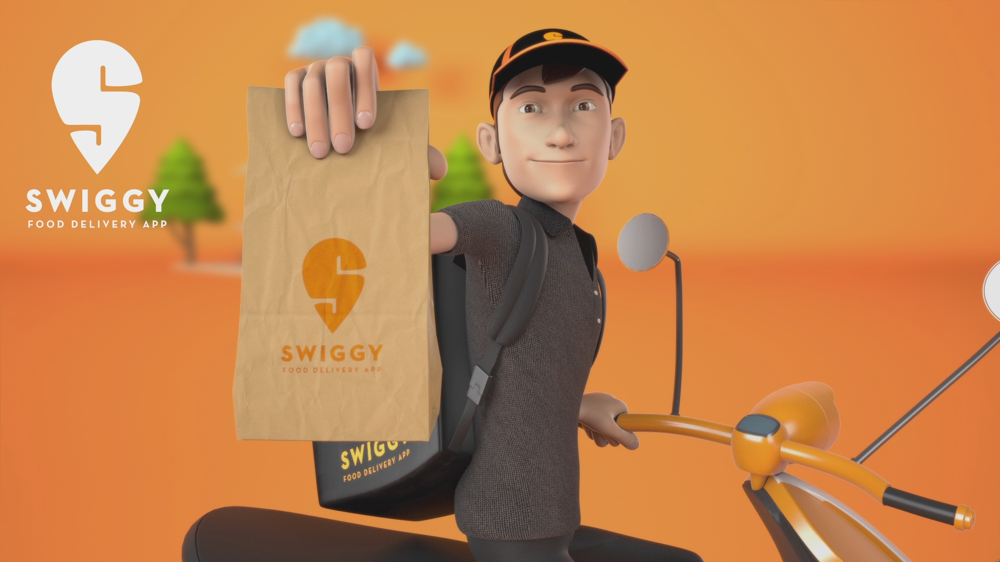

### Importing Necessary Libraries

1.Pandas

2.Matplotlib

3.Seaborn

4.Numpy

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import warnings

# Ignore warnings
warnings.filterwarnings(action='ignore')

### Reading Data

In [2]:
df = pd.read_csv("Swiggy Bangalore Outlet Details.csv")
print(df)  # This will print the dataframe

              Shop_Name                                            Cuisine  \
0          Kanti Sweets                                             Sweets   
1         Mumbai Tiffin             North Indian, Home Food, Thalis, Combo   
2     Sri Krishna sagar  South Indian, North Indian, Fast Food, Beverag...   
3               Al Daaz  American, Arabian, Chinese, Desserts, Fast Foo...   
4         Beijing Bites                                      Chinese, Thai   
..                  ...                                                ...   
113  Wok Paper Scissors                          Pan-Asian, Chinese, Asian   
114  Savoury Restaurant  Arabian, Middle Eastern, North Indian, Grill, ...   
115         Royal Treat            North Indian, Chinese, Seafood, Biryani   
116            Thali 99                                       North Indian   
117  Mani's Dum Biryani                                    Andhra, Biryani   

                               Location Rating Cost_for_Two  
0

In [3]:
# Print basic information about the data
print("Basic Information:\n")
df.info()

Basic Information:

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 118 entries, 0 to 117
Data columns (total 5 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Shop_Name     118 non-null    object
 1   Cuisine       118 non-null    object
 2   Location      118 non-null    object
 3   Rating        118 non-null    object
 4   Cost_for_Two  118 non-null    object
dtypes: object(5)
memory usage: 4.7+ KB


In [4]:
# Check for missing values in each column
df.isnull().sum()

Shop_Name       0
Cuisine         0
Location        0
Rating          0
Cost_for_Two    0
dtype: int64

In [5]:
# Display summary statistics of numerical columns in the DataFrame
df.describe()


,Shop_Name,Cuisine,Location,Rating,Cost_for_Two
count,118,118,118,118,118
unique,115,79,65,13,30
top,La Pino'z Pizza,North Indian,"BTM, BTM",4.1,₹ 300
freq,2,12,13,30,16


In [6]:
pip install -U dataprep

Note: you may need to restart the kernel to use updated packages.


In [7]:
# Import the create_report function from dataprep.eda
from dataprep.eda import create_report

# Generate an EDA report for your DataFrame
report = create_report(df)

  0%|          | 0/532 [00:00<?, ?it/s]

In [8]:
# Create the report
report = create_report(df)

# Save the report as an HTML file
report.save('swiggy_Data_Report.html')

  0%|          | 0/532 [00:00<?, ?it/s]

Report has been saved to swiggy_Data_Report.html!


In [9]:
df.head()

,Shop_Name,Cuisine,Location,Rating,Cost_for_Two
0,Kanti Sweets,Sweets,"Koramangala, Koramangala",4.3,₹ 150
1,Mumbai Tiffin,"North Indian, Home Food, Thalis, Combo","Sector 5, HSR",4.4,₹ 400
2,Sri Krishna sagar,"South Indian, North Indian, Fast Food, Beverag...","6th Block, Koramangala",4.1,₹ 126
3,Al Daaz,"American, Arabian, Chinese, Desserts, Fast Foo...","HSR, HSR",4.4,₹ 400
4,Beijing Bites,"Chinese, Thai","5th Block, Koramangala",4.1,₹ 450


## Data Cleaning

### Transform

- Convert the Cost_for_Two column to numeric data
- Convert the Rating column to numeric data
- Remove any rows with missing data


In [10]:
# Convert the 'Cost_for_Two' column to numeric data by removing the '₹' symbol and converting to integer
df['Cost_for_Two'] = df['Cost_for_Two'].str.replace('₹', '', regex=False).astype(float).astype(int)

# Rename the column to 'Cost_for_Two(₹)'
df.rename(columns={'Cost_for_Two': 'Cost_for_Two(₹)'}, inplace=True)

In [11]:
# Convert the 'Rating' column to numeric data, coercing errors to NaN
df['Rating'] = pd.to_numeric(df['Rating'], errors='coerce')

In [12]:
df.head()

,Shop_Name,Cuisine,Location,Rating,Cost_for_Two(₹)
0,Kanti Sweets,Sweets,"Koramangala, Koramangala",4.3,150
1,Mumbai Tiffin,"North Indian, Home Food, Thalis, Combo","Sector 5, HSR",4.4,400
2,Sri Krishna sagar,"South Indian, North Indian, Fast Food, Beverag...","6th Block, Koramangala",4.1,126
3,Al Daaz,"American, Arabian, Chinese, Desserts, Fast Foo...","HSR, HSR",4.4,400
4,Beijing Bites,"Chinese, Thai","5th Block, Koramangala",4.1,450


In [13]:
# Remove any rows with missing data
df.dropna(inplace=True)

In [14]:
# Remove any special characters or spaces in column names
df.columns=df.columns.str.strip().str.lower().str.replace(' ', '_')

In [15]:
# Display unique values in the 'rating' column
df['rating'].unique()

array([4.3, 4.4, 4.1, 4.2, 3.9, 3.8, 4. , 3.7, 3.6, 4.8, 4.5, 4.6])

In [16]:
# Display summary statistics of numerical columns
df.describe()

,rating,cost_for_two(₹)
count,117.000000,117.000000
mean,4.096581,320.760684
std,0.209240,137.850784
min,3.600000,100.000000
25%,4.000000,200.000000
50%,4.100000,300.000000
75%,4.300000,400.000000
max,4.800000,800.000000


## Observation
1.Average Cost_for_Two members is Rs321.

2.Average rating for the restaurants is 4.09.

3.Max rating and Cost_for_two is 4.8 and Rs800.

## Data Preprocessing

- Create a new column for the average cost per person
- Create a new column for the cost category
- Split the location column into location and area

In [17]:
# Create a new column for the average cost per person
df['avg_cost_per_person'] = df['cost_for_two(₹)'] / 2

In [18]:
# Define the function to categorize cost
def cost_category(cost):
    if cost < 200:
        return 'Low'
    elif cost < 500:
        return 'Medium'
    else:
        return 'High'

# Apply the function to the 'avg_cost_per_person' column to create the 'cost_category' column
df['cost_category'] = df['avg_cost_per_person'].apply(cost_category)

In [19]:
df.head()

,shop_name,cuisine,location,rating,cost_for_two(₹),avg_cost_per_person,cost_category
0,Kanti Sweets,Sweets,"Koramangala, Koramangala",4.3,150,75.0,Low
1,Mumbai Tiffin,"North Indian, Home Food, Thalis, Combo","Sector 5, HSR",4.4,400,200.0,Medium
2,Sri Krishna sagar,"South Indian, North Indian, Fast Food, Beverag...","6th Block, Koramangala",4.1,126,63.0,Low
3,Al Daaz,"American, Arabian, Chinese, Desserts, Fast Foo...","HSR, HSR",4.4,400,200.0,Medium
4,Beijing Bites,"Chinese, Thai","5th Block, Koramangala",4.1,450,225.0,Medium


In [20]:
# Split the location column into location and area
df['location'], df['area'] = df['location'].str.rsplit(', ', 1).str

In [21]:
df.head()

,shop_name,cuisine,location,rating,cost_for_two(₹),avg_cost_per_person,cost_category,area
0,Kanti Sweets,Sweets,Koramangala,4.3,150,75.0,Low,Koramangala
1,Mumbai Tiffin,"North Indian, Home Food, Thalis, Combo",Sector 5,4.4,400,200.0,Medium,HSR
2,Sri Krishna sagar,"South Indian, North Indian, Fast Food, Beverag...",6th Block,4.1,126,63.0,Low,Koramangala
3,Al Daaz,"American, Arabian, Chinese, Desserts, Fast Foo...",HSR,4.4,400,200.0,Medium,HSR
4,Beijing Bites,"Chinese, Thai",5th Block,4.1,450,225.0,Medium,Koramangala


In [22]:
df['area'].unique()

array(['Koramangala', 'HSR', 'BTM', 'Jayanagar'], dtype=object)

In [23]:
# Filter the DataFrame for rows where the 'area' column contains 'Koramangala'
df_Koramangala = df[df['area'].str.contains('Koramangala', na=False)]

# Display the filtered DataFrame
df_Koramangala


,shop_name,cuisine,location,rating,cost_for_two(₹),avg_cost_per_person,cost_category,area
0,Kanti Sweets,Sweets,Koramangala,4.3,150,75.0,Low,Koramangala
2,Sri Krishna sagar,"South Indian, North Indian, Fast Food, Beverag...",6th Block,4.1,126,63.0,Low,Koramangala
4,Beijing Bites,"Chinese, Thai",5th Block,4.1,450,225.0,Medium,Koramangala
5,Kitchens of Punjab,North Indian,Koramangala 4th Block,4.2,350,175.0,Low,Koramangala
9,Yumlane Pizza,"Pizzas, Italian, Mexican",9th Main road,3.8,150,75.0,Low,Koramangala
...,...,...,...,...,...,...,...,...
112,Kritunga,"Andhra, Biryani",5th Block,3.9,500,250.0,Medium,Koramangala
113,Wok Paper Scissors,"Pan-Asian, Chinese, Asian",JNC Road,3.9,219,109.5,Low,Koramangala
115,Royal Treat,"North Indian, Chinese, Seafood, Biryani",5th block Koramangala,4.2,193,96.5,Low,Koramangala
116,Thali 99,North Indian,Koramangala,4.3,200,100.0,Low,Koramangala


In [24]:
# Filter the DataFrame for rows where the 'area' column contains 'HSR'
df_HSR = df[df['area'].str.contains('HSR', na=False)]

# Display the filtered DataFrame
df_HSR


,shop_name,cuisine,location,rating,cost_for_two(₹),avg_cost_per_person,cost_category,area
1,Mumbai Tiffin,"North Indian, Home Food, Thalis, Combo",Sector 5,4.4,400,200.0,Medium,HSR
3,Al Daaz,"American, Arabian, Chinese, Desserts, Fast Foo...",HSR,4.4,400,200.0,Medium,HSR
8,Hotel Manu,"South Indian, Kerala, Chinese, North Indian",HSR,4.1,350,175.0,Low,HSR
19,Shree Khana Khazana,"Indian, Rajasthani",Sector 4,4.1,350,175.0,Low,HSR
24,New Udupi Grand,"Chinese, Jain, North Indian, South Indian",HSR,4.3,150,75.0,Low,HSR
36,Biriyani Zone,"North Indian, Chinese, Biryani",HSR 1st sector,4.1,600,300.0,Medium,HSR
37,Gongura's,"North Indian, Chinese, Biryani",Sector 7,3.8,300,150.0,Low,HSR
39,Leon Grill,"Turkish, Portuguese, American",3rd Sector,4.3,300,150.0,Low,HSR
41,Cakewala,Desserts,HSR,4.3,450,225.0,Medium,HSR
57,Donne Biriyani House,South Indian,3rd sector,4.0,300,150.0,Low,HSR


In [25]:
# Filter the DataFrame for rows where the 'area' column contains 'BTM'
df_BTM = df[df['area'].str.contains('BTM', na=False)]

# Display the filtered DataFrame
df_BTM

,shop_name,cuisine,location,rating,cost_for_two(₹),avg_cost_per_person,cost_category,area
6,99 VARIETY DOSA AND PAV BHAJI- Malli Mane Food...,"Fast Food, North Indian, Chinese",BTM 2nd Stage,4.1,200,100.0,Low,BTM
7,La Pino'z Pizza,Italian,BTM,3.9,500,250.0,Medium,BTM
10,Ambur Star Briyani,"Chinese, South Indian, North Indian, Desserts,...",outer ring road,4.1,500,250.0,Medium,BTM
17,Sri Lakshmi Dhaba,North Indian,Bommanahalli,3.7,200,100.0,Low,BTM
20,Just Bake - Cakes & confectioners,"Desserts, Bakery",BTM 1st stage,4.3,300,150.0,Low,BTM
22,Hotel Godavari,"North Indian, Chinese, Hyderabadi",Marutinagar Main Road,4.0,400,200.0,Medium,BTM
25,Swad Punjab da,Indian,BTM,4.1,250,125.0,Low,BTM
27,High N Hungry,"Andhra, Biryani, Chinese, Desserts, Fast Food,...",4th Cross,4.1,350,175.0,Low,BTM
31,Bengali Fun Foods,North Indian,BTM 2nd stage,4.2,300,150.0,Low,BTM
33,Oottupura,"Kerala, South Indian",BTM,4.3,268,134.0,Low,BTM


In [26]:
# Filter the DataFrame for rows where the 'area' column contains 'Jayanagar'
df_Jayanagar = df[df['area'].str.contains('Jayanagar', na=False)]

# Display the filtered DataFrame
df_Jayanagar

,shop_name,cuisine,location,rating,cost_for_two(₹),avg_cost_per_person,cost_category,area
74,CRAVY WINGS - The American Diner,"American, Fast Food",Bannerghatta Road,4.3,300,150.0,Low,Jayanagar


More no.of restaurants distributed over 3 areas: <b>Koramangala,HSR,BTM</b>

## Data Analysis
### 1. Distribution of Rating in all areas

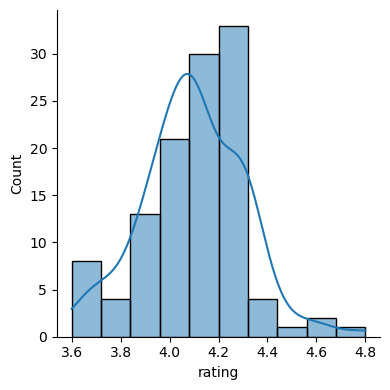

In [27]:
# Create a distribution plot for the 'rating' column where ratings are greater than 0
sns.displot(df[df['rating'] > 0]['rating'], kde=True, height=4)

### Conclusion
From this Distribution Plot, We can conclude that More that '50%' of Restaurants are having a Rating greater than "4.1" with a Maximum Rating of "4.8"

## 2. Area wise Analysis

### A)Cost_for_Two 

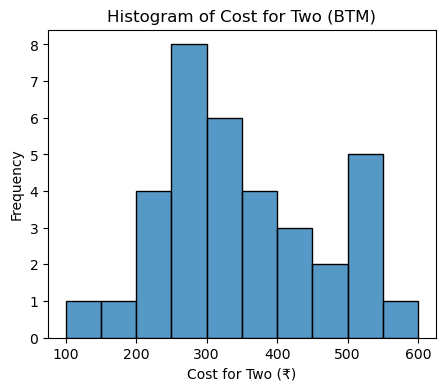

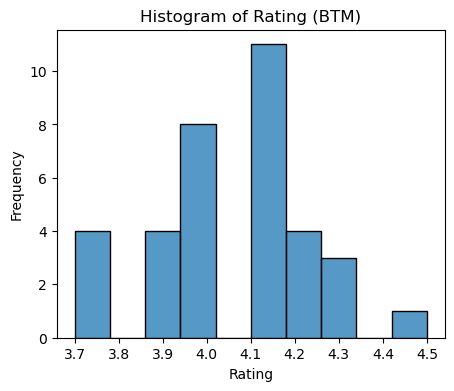

In [28]:
# Plot histogram for 'cost_for_two(₹)' column in df_BTM
plt.figure(figsize=(5, 4))
sns.histplot(df_BTM['cost_for_two(₹)'], bins=10)
plt.title('Histogram of Cost for Two (BTM)')
plt.xlabel('Cost for Two (₹)')
plt.ylabel('Frequency')
plt.show()

# Plot histogram for 'rating' column in df_BTM
plt.figure(figsize=(5, 4))
sns.histplot(df_BTM['rating'], bins=10)
plt.title('Histogram of Rating (BTM)')
plt.xlabel('Rating')
plt.ylabel('Frequency')
plt.show()

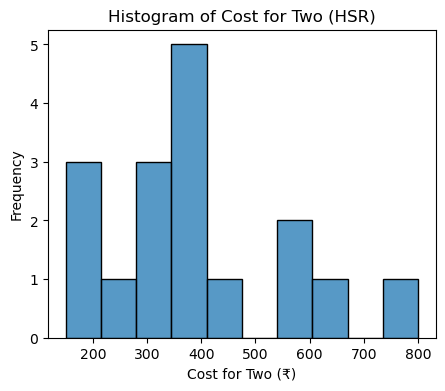

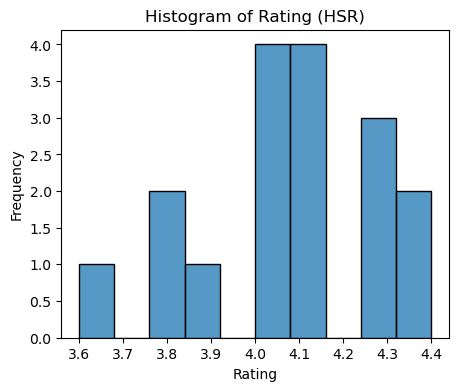

In [29]:
# Plot histogram for 'cost_for_two(₹)' column in df_HSR
plt.figure(figsize=(5, 4))
sns.histplot(df_HSR['cost_for_two(₹)'], bins=10)
plt.title('Histogram of Cost for Two (HSR)')
plt.xlabel('Cost for Two (₹)')
plt.ylabel('Frequency')
plt.show()

# Plot histogram for 'rating' column in df_HSR
plt.figure(figsize=(5, 4))
sns.histplot(df_HSR['rating'], bins=10)
plt.title('Histogram of Rating (HSR)')
plt.xlabel('Rating')
plt.ylabel('Frequency')
plt.show()

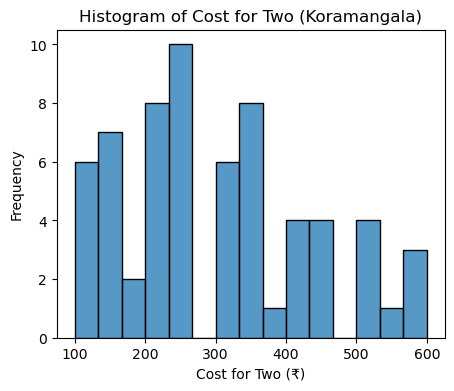

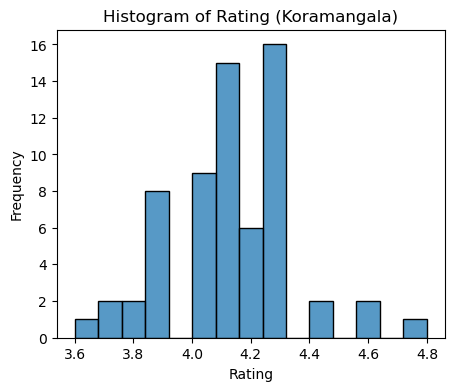

In [30]:
# Plot histogram for 'cost_for_two(₹)' column in df_Koramangala
plt.figure(figsize=(5, 4))
sns.histplot(df_Koramangala['cost_for_two(₹)'], bins=15)
plt.title('Histogram of Cost for Two (Koramangala)')
plt.xlabel('Cost for Two (₹)')
plt.ylabel('Frequency')
plt.show()

# Plot histogram for 'rating' column in df_Koramangala
plt.figure(figsize=(5, 4))
sns.histplot(df_Koramangala['rating'], bins=15)
plt.title('Histogram of Rating (Koramangala)')
plt.xlabel('Rating')
plt.ylabel('Frequency')
plt.show()

## B) Area wise Rating

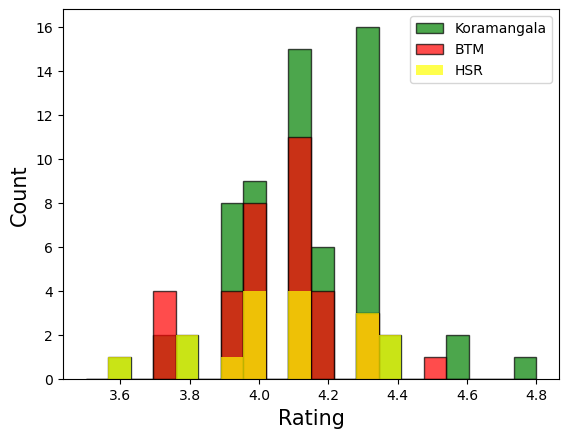

In [31]:
# Plot the histograms for the 'rating' column from different DataFrames

# First histogram for Koramangala
plt.hist(df_Koramangala['rating'], label="Koramangala", alpha=0.7,
         edgecolor='black', color='green', bins=20, range=(3.5, 4.8))

# Second histogram for BTM
plt.hist(df_BTM['rating'], label="BTM", alpha=0.7,
         edgecolor='black', color='red', bins=20, range=(3.5, 4.8))

# Third histogram for HSR
plt.hist(df_HSR['rating'], label='HSR', alpha=0.7, color='yellow', bins=20, range=(3.5, 4.8))

# Labeling the plot
plt.xlabel('Rating', fontsize=15)
plt.ylabel('Count', fontsize=15)
plt.legend()  # Show legend to identify the histograms

# Show the plot
plt.show()

## Conclusion
1.BTM : Most has 3.9 to 4.1 Rating and Approx. Cost for Two People lies between 200 to 350. (Max. Cost goes upto 600)
2.HSR : Most has 4 or above Rating and Approx. Cost for Two People lies between 300 to 400. (Max. Cost goes upto 800)
3.Koramangala : Most has 4.0 to 4.4 Rating and Approx. Cost for Two People lies between 200 to 350. (Max. Cost goes upto 600)

#### Question:High rated restaurants and their cost

In [32]:
# Filter the DataFrame for rows where the 'rating' is 4.0 or higher
df_Highest_Rated_Restaurants = df[df['rating'] >= 4.0]

# Display the filtered DataFrame
df_Highest_Rated_Restaurants

,shop_name,cuisine,location,rating,cost_for_two(₹),avg_cost_per_person,cost_category,area
0,Kanti Sweets,Sweets,Koramangala,4.3,150,75.0,Low,Koramangala
1,Mumbai Tiffin,"North Indian, Home Food, Thalis, Combo",Sector 5,4.4,400,200.0,Medium,HSR
2,Sri Krishna sagar,"South Indian, North Indian, Fast Food, Beverag...",6th Block,4.1,126,63.0,Low,Koramangala
3,Al Daaz,"American, Arabian, Chinese, Desserts, Fast Foo...",HSR,4.4,400,200.0,Medium,HSR
4,Beijing Bites,"Chinese, Thai",5th Block,4.1,450,225.0,Medium,Koramangala
...,...,...,...,...,...,...,...,...
111,Bowl 99,"North Indian, South Indian",kormangala,4.4,200,100.0,Low,Koramangala
114,Savoury Restaurant,"Arabian, Middle Eastern, North Indian, Grill, ...",Madiwala,4.1,600,300.0,Medium,BTM
115,Royal Treat,"North Indian, Chinese, Seafood, Biryani",5th block Koramangala,4.2,193,96.5,Low,Koramangala
116,Thali 99,North Indian,Koramangala,4.3,200,100.0,Low,Koramangala


In [33]:
# Select specific columns from the df_Highest_Rated_Restaurants DataFrame
df_Highest_Rated_Restaurants = df_Highest_Rated_Restaurants.loc[:, ['shop_name', 'rating', 'cost_for_two(₹)']]

# Display the filtered DataFrame
df_Highest_Rated_Restaurants

,shop_name,rating,cost_for_two(₹)
0,Kanti Sweets,4.3,150
1,Mumbai Tiffin,4.4,400
2,Sri Krishna sagar,4.1,126
3,Al Daaz,4.4,400
4,Beijing Bites,4.1,450
...,...,...,...
111,Bowl 99,4.4,200
114,Savoury Restaurant,4.1,600
115,Royal Treat,4.2,193
116,Thali 99,4.3,200


In [34]:
# Group by 'shop_name' and 'rating', and calculate the mean of 'cost_for_two(₹)'
df_Highest_Rated_Restaurants = df_Highest_Rated_Restaurants.groupby(['shop_name', 'rating'])['cost_for_two(₹)'].agg('mean')

# Reset the index to convert the Series back to a DataFrame
df_Highest_Rated_Restaurants = df_Highest_Rated_Restaurants.reset_index()

# Display the updated DataFrame
df_Highest_Rated_Restaurants


,shop_name,rating,cost_for_two(₹)
0,99 VARIETY DOSA AND JUICE-Malli mane food court,4.1,100.0
1,99 VARIETY DOSA AND PAV BHAJI- Malli Mane Food...,4.1,200.0
2,A2B - Adyar Ananda Bhavan,4.2,450.0
3,Abhiruchi Hotel,4.0,250.0
4,Al Daaz,4.4,400.0
...,...,...,...
86,Venu's Donne Biryani,4.3,300.0
87,WarmOven Cake & Desserts,4.1,200.0
88,World of asia,4.0,250.0
89,XO Belgian Waffle,4.3,250.0


In [35]:
# Create a scatter plot
fig = px.scatter(
    df_Highest_Rated_Restaurants,
    x='cost_for_two(₹)', 
    y='rating', 
    color='rating',
    size='cost_for_two(₹)',
    labels={
        'cost_for_two(₹)': 'Approx. Cost for Two (₹)', 
        'rating': 'Rating', 
        'rating': 'Rating Indicator'
    }
)

# Update layout with title
fig.update_layout(title="Analyse 'Approx Cost of 2 People' vs 'Rating'")

# Show the plot
fig.show()

## Revenue Analysis

In [36]:
# Calculate the total revenue for each area
Revenue = {}
Revenue['BTM'] = df_BTM['cost_for_two(₹)'].sum()
Revenue['HSR'] = df_HSR['cost_for_two(₹)'].sum()
Revenue['Koramangala'] = df_Koramangala['cost_for_two(₹)'].sum()

# Create a DataFrame from the revenue data
Revenue_df = pd.DataFrame({
    'City': Revenue.keys(),
    'Revenue': Revenue.values()
})

# Display the DataFrame
Revenue_df

,City,Revenue
0,BTM,11518
1,HSR,6650
2,Koramangala,19061


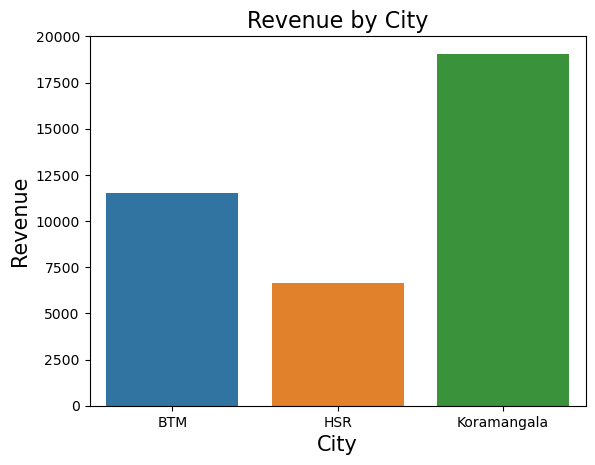

<Figure size 600x400 with 0 Axes>

In [37]:
# Create a bar plot using Seaborn
sns.barplot(x='City', y='Revenue', data=Revenue_df)

# Set labels and title
plt.xlabel('City', fontsize=15)
plt.ylabel('Revenue', fontsize=15)
plt.title('Revenue by City', fontsize=16)

# Adjust the figure size and show the plot
plt.figure(figsize=(6, 4))
plt.show()

## Conclusion
High revenue generating area is Koramangala and the Least is HSR.

### Top 15 Expensive & Highest Rated Restaurants with Approx. Cost for 2 People:

In [38]:
# Sort df_Highest_Rated_Restaurants by 'cost_for_two(₹)' in descending order
df_Expensive_Restaurants = df_Highest_Rated_Restaurants.sort_values(by='cost_for_two(₹)', ascending=False)

# Display the sorted DataFrame
df_Expensive_Restaurants

,shop_name,rating,cost_for_two(₹)
67,Punjabi Rasoi,4.0,800.0
26,Dindigul Thalapakatti Biriyani,4.1,650.0
73,Savoury Restaurant,4.1,600.0
81,Taco Bell,4.3,600.0
66,Pizza Hut,4.0,600.0
...,...,...,...
49,Maa Di Hatti,4.0,129.0
77,Sri Krishna sagar,4.1,126.0
56,NIC Natural Ice Creams,4.2,120.0
82,Tandoori Merchant,4.2,100.0


In [39]:
# Create a bar plot
fig = px.bar(
    data_frame=df_Expensive_Restaurants.head(15),  # Select the top 15 rows
    x='shop_name', 
    y='cost_for_two(₹)', 
    color='rating', 
    labels={'shop_name': 'Restaurant Name', 'cost_for_two(₹)': 'Approx. Cost for Two (₹)', 'rating': 'Rating'}
)

# Update layout with a dark template and title
fig.update_layout(
    template='plotly_dark', 
    title='Top 15 Expensive & Highest Rated Restaurants with Approx. Cost for 2 People'
)

# Show the plot
fig.show()

### Analyze Affordable/Budgeted and Highest Rated Restaurants of Bangalore

In [40]:
# Filter the DataFrame for affordable restaurants with a rating of 4.0 or higher
df_Affordable_Restaurants = df[(df['cost_for_two(₹)'] <= 500) & (df['rating'] >= 4.0)]

# Display the filtered DataFrame
df_Affordable_Restaurants

,shop_name,cuisine,location,rating,cost_for_two(₹),avg_cost_per_person,cost_category,area
0,Kanti Sweets,Sweets,Koramangala,4.3,150,75.0,Low,Koramangala
1,Mumbai Tiffin,"North Indian, Home Food, Thalis, Combo",Sector 5,4.4,400,200.0,Medium,HSR
2,Sri Krishna sagar,"South Indian, North Indian, Fast Food, Beverag...",6th Block,4.1,126,63.0,Low,Koramangala
3,Al Daaz,"American, Arabian, Chinese, Desserts, Fast Foo...",HSR,4.4,400,200.0,Medium,HSR
4,Beijing Bites,"Chinese, Thai",5th Block,4.1,450,225.0,Medium,Koramangala
...,...,...,...,...,...,...,...,...
110,Biryani Pot,"North Indian, Biryani",Madiwala Junction,4.0,500,250.0,Medium,BTM
111,Bowl 99,"North Indian, South Indian",kormangala,4.4,200,100.0,Low,Koramangala
115,Royal Treat,"North Indian, Chinese, Seafood, Biryani",5th block Koramangala,4.2,193,96.5,Low,Koramangala
116,Thali 99,North Indian,Koramangala,4.3,200,100.0,Low,Koramangala


In [41]:
# Sort the DataFrame by 'rating' in descending order and modify the DataFrame in place
df_Affordable_Restaurants.sort_values(by='rating', ascending=False, inplace=True)

# Select the top 10 entries
df_Affordable_Restaurants = df_Affordable_Restaurants.head(10)

# Display the DataFrame
df_Affordable_Restaurants

,shop_name,cuisine,location,rating,cost_for_two(₹),avg_cost_per_person,cost_category,area
78,Khichdi Experiment,"Home Food, Healthy Food, Indian",Koramangala,4.8,200,100.0,Low,Koramangala
82,Natural Ice Cream,Ice Cream,Near Wipro Park Signal,4.6,150,75.0,Low,Koramangala
94,Corner House Ice Cream,"Ice Cream, Desserts",7th Block,4.6,250,125.0,Low,Koramangala
80,Chinese Bae,"Chinese, Thai",BTM,4.5,450,225.0,Medium,BTM
3,Al Daaz,"American, Arabian, Chinese, Desserts, Fast Foo...",HSR,4.4,400,200.0,Medium,HSR
111,Bowl 99,"North Indian, South Indian",kormangala,4.4,200,100.0,Low,Koramangala
1,Mumbai Tiffin,"North Indian, Home Food, Thalis, Combo",Sector 5,4.4,400,200.0,Medium,HSR
77,Leon Grill,"Turkish, Portuguese, American, Grill",5th Block,4.3,300,150.0,Low,Koramangala
40,Venu's Donne Biryani,Biryani,Chocolate Factory Road,4.3,300,150.0,Low,BTM
41,Cakewala,Desserts,HSR,4.3,450,225.0,Medium,HSR


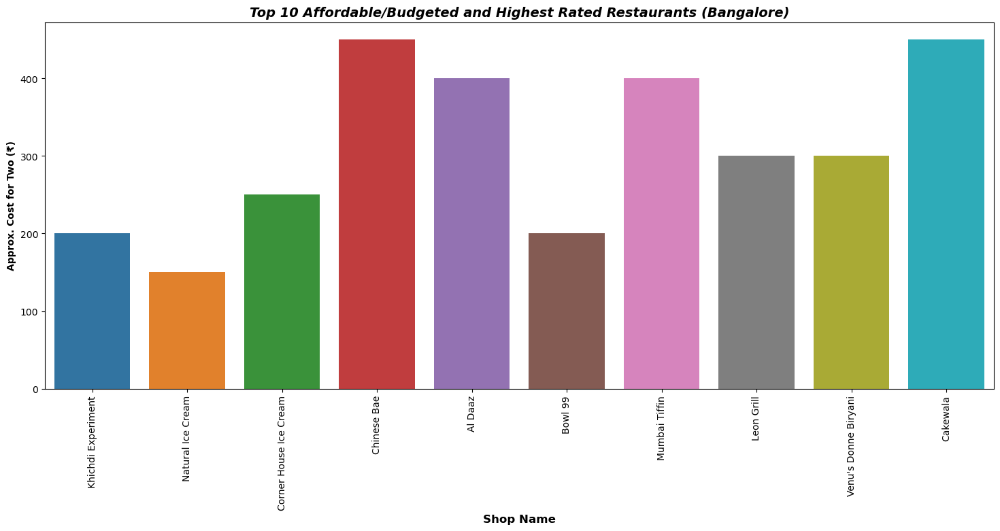

In [42]:
# Create a bar plot
plt.figure(figsize=(18, 7))
sns.barplot(x=df_Affordable_Restaurants['shop_name'], y=df_Affordable_Restaurants['cost_for_two(₹)'])

# Set title and labels
plt.title('Top 10 Affordable/Budgeted and Highest Rated Restaurants (Bangalore)', fontsize=14, fontweight='bold', fontstyle='italic')
plt.xlabel('Shop Name', fontsize=12, fontweight='bold')
plt.ylabel('Approx. Cost for Two (₹)', fontsize=10, fontweight='bold')

# Rotate x-axis labels for better readability
plt.xticks(rotation=90)

# Show the plot
plt.show()

# Cuisine Analysis

In [43]:
# Initialize a dictionary to hold the frequency of each cuisine
freq_dict = {}

# Loop through each unique value in the 'cuisine' column
for i in df['cuisine'].unique():
    # Split the string into a list of cuisines
    cuisines_list = i.split(',')
    # Process each cuisine in the list
    for cuisine in cuisines_list:
        # Remove leading spaces
        cuisine = cuisine.strip()
        # Update the frequency dictionary
        if cuisine in freq_dict:
            freq_dict[cuisine] += 1
        else:
            freq_dict[cuisine] = 1

# Print the frequency dictionary
print(freq_dict)
print()

# Print the total number of records in the DataFrame
print('Total Records: \t', len(df))


{'Sweets': 2, 'North Indian': 32, 'Home Food': 2, 'Thalis': 1, 'Combo': 1, 'South Indian': 23, 'Fast Food': 16, 'Beverages': 9, 'Jain': 2, 'American': 8, 'Arabian': 4, 'Chinese': 35, 'Desserts': 15, 'Mughlai': 7, 'Thai': 2, 'Italian': 4, 'Kerala': 6, 'Pizzas': 5, 'Mexican': 3, 'Andhra': 12, 'Seafood': 8, 'Biryani': 18, 'Indian': 5, 'Rajasthani': 1, 'Bakery': 2, 'Healthy Food': 4, 'Hyderabadi': 5, 'Snacks': 4, 'Turkish': 2, 'Portuguese': 2, 'Chaat': 2, 'Asian': 3, 'Continental': 3, 'Mediterranean': 1, 'Lebanese': 1, 'Cafe': 2, 'Salads': 2, 'Pastas': 1, 'Punjabi': 2, 'Juices': 2, 'Kebabs': 2, 'Grill': 2, 'Ice Cream': 2, 'Tandoor': 1, 'Chettinad': 2, 'Pan-Asian': 2, 'Oriental': 1, 'Middle Eastern': 1}

Total Records: 	 117


In [44]:
# Convert the frequency dictionary into a DataFrame
cuisine = freq_dict.keys()
freq = freq_dict.values()

df_cusine_analysis = pd.DataFrame()
df_cusine_analysis['Cuisine'] = cuisine
df_cusine_analysis['Count'] = freq

In [45]:
# Create a bar plot
fig = px.bar(data_frame=df_cusine_analysis, 
            x=df_cusine_analysis['Cuisine'], 
            y=df_cusine_analysis['Count'],  
             color=df_cusine_analysis['Count'], 
            labels={'x' : 'cusine', 'y' : 'Count', 'color' : 'Count'})
fig.update_layout(template='plotly_dark', 
                  title ="Cuisines Overall Analysis (Bangalore)")
fig.show()

In [46]:
# Create a pie chart
fig = px.pie(data_frame=df_cusine_analysis, 
             names = df_cusine_analysis['Cuisine'], 
             values = df_cusine_analysis['Count'], 
             title = 'Overall Distribution of Cuisines in Bangalore Restaurants')

# Update traces for better label positioning and information display
fig.update_traces(textposition='inside', textinfo='percent+label')

# Show the plot
fig.show()

### Conclusion:
From the above Visualizations, We can say, Most of the Resturants sell "Chinese" which is around '12.9%' followed by "North Indian" & "South Indian" Cuisines which are around '11.8%' & '8.46%'.

## Cuisine Areawise Analysis

### 1.BTM area

In [47]:
# Initialize a dictionary to hold the frequency of each cuisine
freq_BTM = {}

# Loop through each unique value in the 'cuisine' column of df_BTM
for i in df_BTM['cuisine'].unique():
    # Split the string into a list of cuisines
    Cuisine_List = i.split(',')
    # Process each cuisine in the list
    for Cuisine in Cuisine_List:
        # Remove leading spaces
        Cuisine = Cuisine.strip()
        # Update the frequency dictionary
        if Cuisine in freq_BTM:
            freq_BTM[Cuisine] += 1
        else:
            freq_BTM[Cuisine] = 1

# Print the frequency dictionary
print(freq_BTM)
print()

# Print the total number of records in df_BTM
print('Total Records:', len(df_BTM))

{'Fast Food': 6, 'North Indian': 16, 'Chinese': 18, 'Italian': 1, 'South Indian': 10, 'Desserts': 6, 'Kerala': 4, 'Andhra': 7, 'Beverages': 4, 'Mughlai': 3, 'Seafood': 3, 'Bakery': 1, 'Hyderabadi': 4, 'Indian': 2, 'Biryani': 8, 'Snacks': 1, 'Sweets': 1, 'Chaat': 1, 'Arabian': 2, 'Thai': 1, 'Tandoor': 1, 'Punjabi': 1, 'Healthy Food': 1, 'Chettinad': 1, 'Middle Eastern': 1, 'Grill': 1}

Total Records: 35


In [48]:
# Convert the frequency dictionary into a DataFrame
df_cusine_btm = pd.DataFrame({
    'cuisine': list(freq_BTM.keys()),
    'Count': list(freq_BTM.values())
})

In [49]:
# Create a bar plot
fig = px.bar(
    data_frame=df_cusine_btm, 
    x='cuisine', 
    y='Count', 
    color='Count', 
    labels={'cuisine': 'Cuisine', 'Count': 'Count'}
)

# Update layout with a dark template and title
fig.update_layout(
    template='plotly_dark', 
    title="Cuisines Analysis - BTM (Bangalore)"
)

# Show the plot
fig.show()

In [50]:
# Create a pie chart
fig = px.pie(
          names = df_cusine_btm['cuisine'], 
          values = df_cusine_btm['Count'], 
          title = 'Distribution of Cuisines in BTM Bangalore Restaurants'
)

# Update traces for better label positioning and information display
fig.update_traces(textposition='inside', textinfo='percent+label')

# Show the plot
fig.show()

### Conclusion:
From the above Visualizations, We can say, In BTM Area, Most of the Resturants sell "Chinese" which is around '17.1%' followed by "North Indian" & "South Indian" Cuisines which are around '15.2%' & '9.52%'.

### 2.HSR Area

In [51]:
# Initialize a dictionary to hold the frequency of each cuisine
freq_HSR = {}

# Loop through each unique value in the 'cuisine' column of df_HSR
for i in df_HSR['cuisine'].unique():
    # Split the string into a list of cuisines
    Cuisine_List = i.split(',')
    # Process each cuisine in the list
    for Cuisine in Cuisine_List:
        # Remove leading spaces
        Cuisine = Cuisine.strip()
        # Update the frequency dictionary
        if Cuisine in freq_HSR:
            freq_HSR[Cuisine] += 1
        else:
            freq_HSR[Cuisine] = 1

# Print the frequency dictionary
print(freq_HSR)
print()

# Print the total number of records in df_HSR
print('Total Records:', len(df_HSR))


{'North Indian': 6, 'Home Food': 1, 'Thalis': 1, 'Combo': 1, 'American': 3, 'Arabian': 1, 'Chinese': 4, 'Desserts': 3, 'Fast Food': 1, 'Mughlai': 1, 'South Indian': 4, 'Kerala': 1, 'Indian': 1, 'Rajasthani': 1, 'Jain': 1, 'Biryani': 3, 'Turkish': 1, 'Portuguese': 1, 'Andhra': 1, 'Bakery': 1, 'Juices': 1, 'Kebabs': 1, 'Snacks': 1, 'Chettinad': 1}

Total Records: 17


In [52]:
# Convert the frequency dictionary into a DataFrame
df_Cuisine_HSR = pd.DataFrame({
    'cuisine': list(freq_HSR.keys()),
    'Count': list(freq_HSR.values())
})

# Display the DataFrame
print(df_Cuisine_HSR)


         cuisine  Count
0   North Indian      6
1      Home Food      1
2         Thalis      1
3          Combo      1
4       American      3
5        Arabian      1
6        Chinese      4
7       Desserts      3
8      Fast Food      1
9        Mughlai      1
10  South Indian      4
11        Kerala      1
12        Indian      1
13    Rajasthani      1
14          Jain      1
15       Biryani      3
16       Turkish      1
17    Portuguese      1
18        Andhra      1
19        Bakery      1
20        Juices      1
21        Kebabs      1
22        Snacks      1
23     Chettinad      1


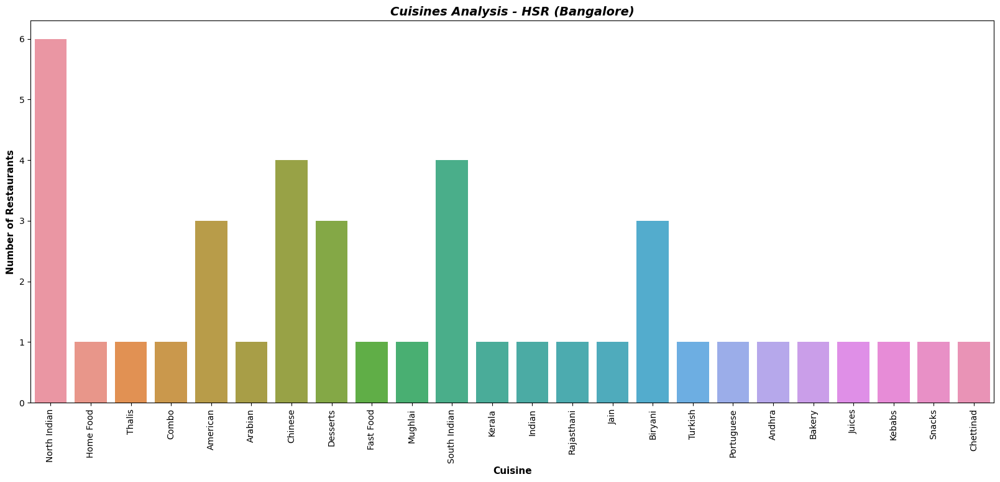

In [53]:
# Create a bar plot
plt.figure(figsize=(20, 8))
sns.barplot(
    x='cuisine', 
    y='Count', 
    data=df_Cuisine_HSR
)

# Rotate x-axis labels
plt.xticks(rotation=90)

# Add title and labels with styling
plt.title('Cuisines Analysis - HSR (Bangalore)', fontsize=14, fontweight='bold', fontstyle='italic')
plt.xlabel('Cuisine', fontsize=11, fontweight='bold')
plt.ylabel('Number of Restaurants', fontsize=11, fontweight='bold')

# Show the plot
plt.show()

In [54]:
# Create a pie chart
fig = px.pie(
    data_frame=df_Cuisine_HSR,
    names='cuisine',   # Use the column name directly
    values='Count',    # Use the column name directly
    title='Distribution of Cuisines in HSR Bangalore Restaurants'
)

# Update traces for better label positioning and information display
fig.update_traces(textposition='inside', textinfo='percent+label')

# Show the plot
fig.show()

### Conclusion:
From the above Visualizations, We can say, In HSR Area, "North Indian" Cuisines are dominated by around '14.3%' followed by "Chinese" & "South Indian" Cuisines '9.52%' & '9.52%' Restaurants respectively.
So, We can also infer that - In HSR Area, We may have more "North Indian" people staying there

## Koramangala Area

In [55]:
# Initialize a dictionary to hold the frequency of each cuisine
freq_Koramangala = {}

# Loop through each unique value in the 'cuisine' column of df_Koramangala
for i in df_Koramangala['cuisine'].unique():
    # Split the string into a list of cuisines
    Cuisine_List = i.split(',')
    # Process each cuisine in the list
    for Cuisine in Cuisine_List:
        # Remove leading and trailing spaces
        Cuisine = Cuisine.strip()
        # Update the frequency dictionary
        if Cuisine in freq_Koramangala:
            freq_Koramangala[Cuisine] += 1
        else:
            freq_Koramangala[Cuisine] = 1

# Print the frequency dictionary
print(freq_Koramangala)
print()

# Print the total number of unique cuisines
print('Total Unique Cuisines:', len(freq_Koramangala))

{'Sweets': 1, 'South Indian': 11, 'North Indian': 14, 'Fast Food': 9, 'Beverages': 5, 'Jain': 1, 'Chinese': 15, 'Thai': 2, 'Pizzas': 5, 'Italian': 4, 'Mexican': 3, 'Desserts': 8, 'Andhra': 5, 'Biryani': 10, 'Seafood': 5, 'Arabian': 1, 'Healthy Food': 3, 'American': 6, 'Snacks': 3, 'Mughlai': 3, 'Asian': 3, 'Continental': 3, 'Mediterranean': 1, 'Lebanese': 1, 'Bakery': 1, 'Cafe': 2, 'Salads': 2, 'Pastas': 1, 'Punjabi': 1, 'Hyderabadi': 1, 'Kerala': 1, 'Turkish': 1, 'Portuguese': 1, 'Grill': 1, 'Home Food': 1, 'Indian': 2, 'Ice Cream': 2, 'Juices': 1, 'Chaat': 1, 'Kebabs': 1, 'Pan-Asian': 2, 'Oriental': 1}

Total Unique Cuisines: 42


In [56]:
# Convert the frequency dictionary into a DataFrame
df_Cuisine_Koramangala = pd.DataFrame({
    'cuisine': list(freq_Koramangala.keys()),  # Convert dictionary keys to a list
    'Count': list(freq_Koramangala.values())   # Convert dictionary values to a list
})

# Display the DataFrame
print(df_Cuisine_Koramangala)

          cuisine  Count
0          Sweets      1
1    South Indian     11
2    North Indian     14
3       Fast Food      9
4       Beverages      5
5            Jain      1
6         Chinese     15
7            Thai      2
8          Pizzas      5
9         Italian      4
10        Mexican      3
11       Desserts      8
12         Andhra      5
13        Biryani     10
14        Seafood      5
15        Arabian      1
16   Healthy Food      3
17       American      6
18         Snacks      3
19        Mughlai      3
20          Asian      3
21    Continental      3
22  Mediterranean      1
23       Lebanese      1
24         Bakery      1
25           Cafe      2
26         Salads      2
27         Pastas      1
28        Punjabi      1
29     Hyderabadi      1
30         Kerala      1
31        Turkish      1
32     Portuguese      1
33          Grill      1
34      Home Food      1
35         Indian      2
36      Ice Cream      2
37         Juices      1
38          Chaat      1


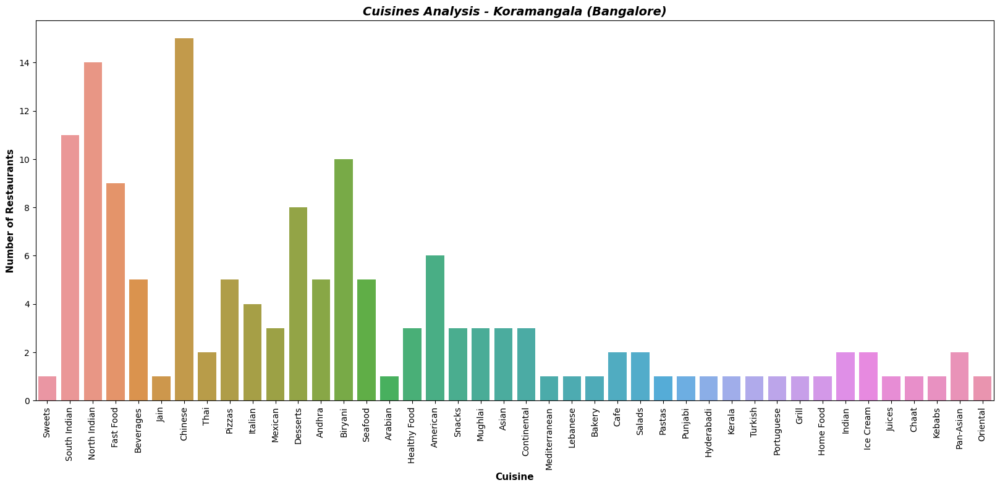

In [57]:
# Create a bar plot
plt.figure(figsize=(20, 8))
sns.barplot(
    x='cuisine', 
    y='Count', 
    data=df_Cuisine_Koramangala
)

# Rotate x-axis labels for better readability
plt.xticks(rotation=90)

# Add title and labels with styling
plt.title('Cuisines Analysis - Koramangala (Bangalore)', fontsize=14, fontweight='bold', fontstyle='italic')
plt.xlabel('Cuisine', fontsize=11, fontweight='bold')
plt.ylabel('Number of Restaurants', fontsize=11, fontweight='bold')

# Show the plot
plt.show()

In [58]:
# Create a pie chart
fig = px.pie(
    data_frame=df_Cuisine_Koramangala,
    names='cuisine',    # Use the column name directly
    values='Count',     # Use the column name directly
    title='Distribution of Cuisines in Koramangala Bangalore Restaurants'
)

# Update traces for better label positioning and information display
fig.update_traces(textposition='inside', textinfo='percent+label')

# Show the plot
fig.show()

### Conclusion:
From the above Visualizations, We can say, In Koramangala Area, "Chinese" Cuisines are dominated by around '10.3%' followed by "North Indian" & "South Indian" Cuisines '9.66%' & '7.59%' Restaurants respectively.
So, We can also infer that Most of the people are fond of the "Chinese" Cuisines.

In [59]:
# Print the average cost for each cuisine
print("\nAverage cost for each cuisine:\n")
print(df.groupby('cuisine')['cost_for_two(₹)'].mean())

# Print the average rating for each cuisine
print("\nAverage rating for each cuisine:\n")
print(df.groupby('cuisine')['rating'].mean())


Average cost for each cuisine:

cuisine
American                                                                  450.000000
American, Arabian, Chinese, Desserts, Fast Food, Mughlai, North Indian    400.000000
American, Fast Food                                                       350.000000
Andhra, Biryani                                                           433.333333
Andhra, Biryani, Chinese, Desserts, Fast Food, Seafood, South Indian      225.000000
                                                                             ...    
South Indian, North Indian, Fast Food, Beverages, Jain                    126.000000
South Indian, Snacks, North Indian, Chinese                               250.000000
Sweets                                                                    150.000000
Turkish, Portuguese, American                                             300.000000
Turkish, Portuguese, American, Grill                                      300.000000
Name: cost_for_two(₹), L

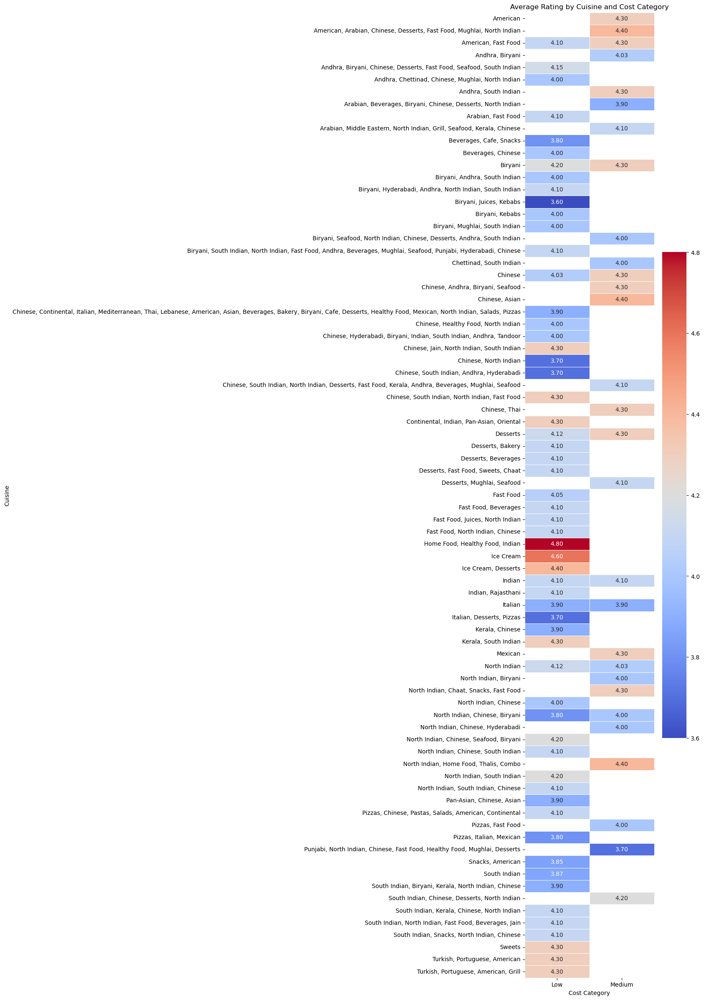

In [60]:
# Group by cuisine and cost category, calculate mean rating
heatmap_data = df.groupby(['cuisine', 'cost_category'])['rating'].mean().reset_index()

# Pivot the data for heatmap visualization
heatmap_data = heatmap_data.pivot(index='cuisine', columns='cost_category', values='rating')

# Create the heatmap
plt.figure(figsize=(5, 30))
sns.heatmap(heatmap_data, cmap='coolwarm', annot=True, fmt='.2f', linewidths=.5)
plt.title('Average Rating by Cuisine and Cost Category')
plt.xlabel('Cost Category')
plt.ylabel('Cuisine')
plt.show()

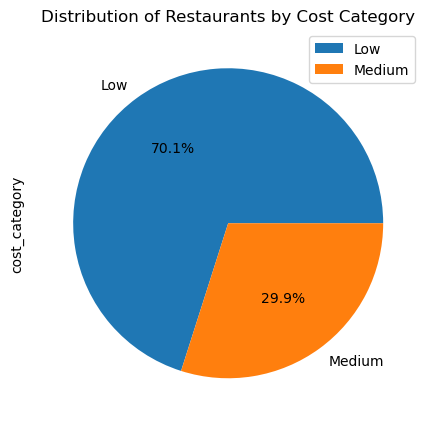

In [61]:
# Create a pie chart of the distribution of restaurants by cost category
plt.figure(figsize=(5, 6))  # Fixed missing closing parenthesis
df['cost_category'].value_counts().plot(kind='pie', autopct='%1.1f%%')  # Fixed the percentage format
plt.title('Distribution of Restaurants by Cost Category')
plt.legend()
plt.show()

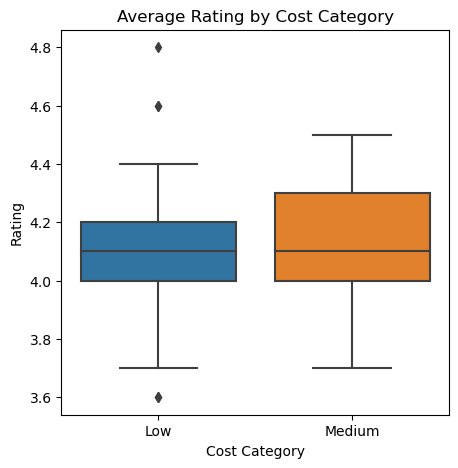

In [62]:
# Average rating by cost category
plt.figure(figsize=(5, 5))
sns.boxplot(data=df, x="cost_category", y="rating")
plt.title('Average Rating by Cost Category')
plt.xlabel('Cost Category')
plt.ylabel('Rating')
plt.show()